# Poisoning on Neural Networks


## Set the environment
Install the framework for generating adversarial examples

In [ ]:
!pip install numpy matplotlib nose
!pip install adversarial-robustness-toolbox

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 154 kB 5.0 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.3 MB 4.3 MB/s 
     |████████████████████████████████| 3.3 MB 50.8 MB/s 
     |████████████████████████████████| 34.5 MB 10.0 kB/s 
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.34.0
    Uninstalling llvmlite-0.34.0:
      Successfully uninstalled llvmlite-0.34.0
  Attempting uninstall: numba
    Found existing installation: numba 0.51.2
    Uninstalling numba-0.51.2:
      Successfully uninstalled numba-0.51.2


In [ ]:
# Import required modules
import torch
import torch.nn as nn
import torch.optim as optim 
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm

import os
import numpy as np
import matplotlib.pyplot as plt
import pprint
import json

reproducability stuff

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f'Using device: {device}')

import random
torch.manual_seed(0)
np.random.seed(0)
random.seed(0)

torch.cuda.manual_seed(0)

Using device: cuda:0


In [ ]:
from art.estimators.classification import PyTorchClassifier
from art.attacks.poisoning import PoisoningAttackBackdoor
from art.attacks.poisoning.perturbations import add_pattern_bd, add_single_bd, insert_image
from art.utils import load_mnist, preprocess, load_dataset
from art.defences.detector.poison import ActivationDefence

## 1) Dataset 

In [ ]:
(x_raw, y_raw), (x_raw_test, y_raw_test), min_, max_ = load_mnist(raw=True)

# Random Selection:
n_train = np.shape(x_raw)[0]
num_selection = 7500
random_selection_indices = np.random.choice(n_train, num_selection)
x_raw = x_raw[random_selection_indices]
y_raw = y_raw[random_selection_indices]

BACKDOOR_TYPE = "pattern" # one of ['pattern', 'pixel', 'image']
#BACKDOOR_TYPE = "pixel" # one of ['pattern', 'pixel', 'image']

In [ ]:
# Choose type of backdoor
max_val = np.max(x_raw)
def add_modification(x):
        if BACKDOOR_TYPE == 'pattern':
            return add_pattern_bd(x, pixel_value=max_val)
        elif BACKDOOR_TYPE == 'pixel':
            return add_single_bd(x, pixel_value=max_val) 
        else:
            raise("Unknown backdoor type")

In [ ]:
def poison_dataset(x_clean, y_clean, percent_poison, poison_func):
    x_poison = np.copy(x_clean)
    y_poison = np.copy(y_clean)
    is_poison = np.zeros(np.shape(y_poison))
    
    # 1. All-to-all attack
    sources=np.arange(10) # 0, 1, 2, 3, ...
    targets=(np.arange(10) + 1) % 10 # 1, 2, 3, 4, ...

    # 2. Single target attack (label 1)
    #sources = np.array([0])
    #targets = np.array([1])

    print("Sources", sources)
    print("Targets", targets)
    for i, (src, tgt) in enumerate(zip(sources, targets)):
        n_points_in_tgt = np.size(np.where(y_clean == tgt))
        num_poison = round((percent_poison * n_points_in_tgt) / (1 - percent_poison))
        print("Number of poisoned samples is %s for class %s" % (num_poison, tgt))
        src_imgs = x_clean[y_clean == src]

        n_points_in_src = np.shape(src_imgs)[0]
        indices_to_be_poisoned = np.random.choice(n_points_in_src, num_poison)

        imgs_to_be_poisoned = np.copy(src_imgs[indices_to_be_poisoned])
        backdoor_attack = PoisoningAttackBackdoor(poison_func)
        imgs_to_be_poisoned, poison_labels = backdoor_attack.poison(imgs_to_be_poisoned.squeeze(), y=np.ones(num_poison) * tgt)
        x_poison = np.append(x_poison, imgs_to_be_poisoned, axis=0)
        y_poison = np.append(y_poison, poison_labels, axis=0)
        is_poison = np.append(is_poison, np.ones(num_poison))

    is_poison = is_poison != 0

    return is_poison, x_poison, y_poison

In [ ]:
# Poison training data
print("Training set")
percent_poison = .33
(is_poison_train, x_poisoned_raw, y_poisoned_raw) = poison_dataset(x_raw, y_raw, percent_poison, add_modification)
x_train, y_train = preprocess(x_poisoned_raw, y_poisoned_raw)
# Add channel axis:
x_train = np.expand_dims(x_train, axis=3)

# Poison test data
print("Test set")
(is_poison_test, x_poisoned_raw_test, y_poisoned_raw_test) = poison_dataset(x_raw_test, y_raw_test, percent_poison, add_modification)
x_test, y_test = preprocess(x_poisoned_raw_test, y_poisoned_raw_test)
# Add channel axis:
x_test = np.expand_dims(x_test, axis=3)

# Shuffle training data
n_train = np.shape(y_train)[0]
shuffled_indices = np.arange(n_train)
np.random.shuffle(shuffled_indices)
x_train = x_train[shuffled_indices]
y_train = y_train[shuffled_indices]

Training set
Sources [0 1 2 3 4 5 6 7 8 9]
Targets [1 2 3 4 5 6 7 8 9 0]
Number of poisoned samples is 431 for class 1
Number of poisoned samples is 346 for class 2
Number of poisoned samples is 375 for class 3
Number of poisoned samples is 345 for class 4
Number of poisoned samples is 338 for class 5
Number of poisoned samples is 376 for class 6
Number of poisoned samples is 384 for class 7
Number of poisoned samples is 363 for class 8
Number of poisoned samples is 352 for class 9
Number of poisoned samples is 382 for class 0
Test set
Sources [0 1 2 3 4 5 6 7 8 9]
Targets [1 2 3 4 5 6 7 8 9 0]
Number of poisoned samples is 559 for class 1
Number of poisoned samples is 508 for class 2
Number of poisoned samples is 497 for class 3
Number of poisoned samples is 484 for class 4
Number of poisoned samples is 439 for class 5
Number of poisoned samples is 472 for class 6
Number of poisoned samples is 506 for class 7
Number of poisoned samples is 480 for class 8
Number of poisoned samples is 

## 2) Model

**Pytorch Model**

In [ ]:
"""ResNet in PyTorch.

Reference:
[1] Kaiming He, Xiangyu Zhang, Shaoqing Ren, Jian Sun
    Deep Residual Learning for Image Recognition. arXiv:1512.03385
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
import time

from torch.autograd import Variable


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1, use_batchnorm=True):
        super(BasicBlock, self).__init__()

        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False
        )
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        if not use_batchnorm:
            self.bn1 = self.bn2 = nn.Sequential()

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(
                    in_planes, self.expansion * planes, kernel_size=1, stride=stride, bias=False
                ),
                nn.BatchNorm2d(self.expansion * planes) if use_batchnorm else nn.Sequential(),
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, in_planes, planes, stride=1, use_batchnorm=True):
        super(Bottleneck, self).__init__()

        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv3 = nn.Conv2d(planes, self.expansion * planes, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(self.expansion * planes)

        if not use_batchnorm:
            self.bn1 = self.bn2 = self.bn3 = nn.Sequential()

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(
                    in_planes, self.expansion * planes, kernel_size=1, stride=stride, bias=False
                ),
                nn.BatchNorm2d(self.expansion * planes) if use_batchnorm else nn.Sequential(),
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = F.relu(self.bn2(self.conv2(out)))
        out = self.bn3(self.conv3(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10, 
                 use_batchnorm=True):
        super(ResNet, self).__init__()

        self.in_planes = 64
        self.use_batchnorm = use_batchnorm
        self.conv1 = nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64) if use_batchnorm else nn.Sequential()
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.linear = nn.Linear(512 * block.expansion, num_classes)
   
    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride, self.use_batchnorm))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        x = x.permute(0,3,1,2).type(torch.FloatTensor).cuda()
        #print(x.shape)
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = F.avg_pool2d(out, 4)
        out = out.view(out.size(0), -1)
        out = self.linear(out)

        return out

def ResNet10(num_classes=10, use_batchnorm=True):
    return ResNet(BasicBlock, [1, 1, 1, 1], num_classes=num_classes, use_batchnorm=use_batchnorm)


In [ ]:
model = ResNet10()

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

In [ ]:
classifier = PyTorchClassifier(model=model, loss=criterion, optimizer=optimizer, nb_classes=10, clip_values=(min_, max_), input_shape=x_train.shape[1:])

## 3) Training, Validation, Testing functions.

In [ ]:
# No logs for training with Pytorch
classifier.fit(x_train, y_train, nb_epochs=10, batch_size=128)

*Accuracy on Clean Examples*


Clean test set accuracy: 98.34%


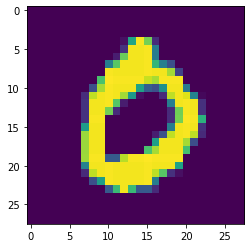

Prediction: 0


In [ ]:
clean_x_test = x_test[is_poison_test == 0]
clean_y_test = y_test[is_poison_test == 0]

clean_preds = np.argmax(classifier.predict(clean_x_test), axis=1)
clean_correct = np.sum(clean_preds == np.argmax(clean_y_test, axis=1))
clean_total = clean_y_test.shape[0]

clean_acc = clean_correct / clean_total
print("\nClean test set accuracy: %.2f%%" % (clean_acc * 100))

# Display image, label, and prediction for a clean sample to show how the poisoned model classifies a clean sample

c = 0 # class to display
i = 0 # image of the class to display

c_idx = np.where(np.argmax(clean_y_test,1) == c)[0][i] # index of the image in clean arrays

plt.imshow(clean_x_test[c_idx].squeeze())
plt.show()
clean_label = c
print("Prediction: " + str(clean_preds[c_idx]))

*Performance of the poisoning attack*

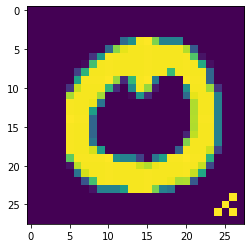

Prediction: 1

 Effectiveness of poison: 98.13%


In [ ]:
poison_x_test = x_test[is_poison_test]
poison_y_test = y_test[is_poison_test]

poison_preds = np.argmax(classifier.predict(poison_x_test), axis=1)
poison_correct = np.sum(poison_preds == np.argmax(poison_y_test, axis=1))
poison_total = poison_y_test.shape[0]

# Display image, label, and prediction for a poisoned image to see the backdoor working

c = 1 # class to display
i = 0 # image of the class to display

c_idx = np.where(np.argmax(poison_y_test,1) == c)[0][i] # index of the image in poison arrays

plt.imshow(poison_x_test[c_idx].squeeze())
plt.show()
poison_label = c
print("Prediction: " + str(poison_preds[c_idx]))

poison_acc = poison_correct / poison_total
print("\n Effectiveness of poison: %.2f%%" % (poison_acc * 100))

*Accuracy on Testset (Clean + Poisoned)*

In [ ]:
# Similar than clean accuracy
# Avoid detection
total_correct = clean_correct + poison_correct
total = clean_total + poison_total

total_acc = total_correct / total
print("\n Overall test set accuracy: %.2f%%" % (total_acc * 100))


 Overall test set accuracy: 98.27%


## 4) Try Here Defense against Poisoning 

**Utility functions**

In [ ]:
def create_figure_axes(
    nrows, 
    ncols, 
    figsize
    ):
    # Creating a figure and axes
    fig, axes = plt.subplots(
        nrows=nrows, 
        ncols=ncols, 
        figsize=figsize
        )

    # Returning the figure and axes
    return fig, axes

In [ ]:
# Function for plotting images
def plot_images(
    images,
    labels,    
    plot_label,
    is_categorical,
    nrows, 
    ncols,
    figsize
    ):    
    # Creating a figure and axes
    fig, axes = create_figure_axes(
        nrows=nrows, 
        ncols=ncols, 
        figsize=figsize
        )

    # Defining a counting variable
    counter = 0

    # Iterating over our rows and cols,
    # plotting poisoned test images
    # along with their true targets
    for i in range(nrows):
        for j in range(ncols):
            # Converting the current label to an integer 
            # if it is categorical
            if is_categorical:
                label = np.argmax(a=labels[counter])
            else:
                label = labels[counter]
            
            # Displaying the current image
            # and setting axis title
            axes[i, j].imshow(images[counter])
            axes[i, j].set_title(label=f"{plot_label}: {label}", fontdict={'fontsize':30})

            # Disabling ticks
            axes[i, j].set_xticks(ticks=[])
            axes[i, j].set_yticks(ticks=[])

            # Incrementing the counter
            counter += 1

**Activation Clustering**
- Here we try the technique for detecting poisoned samples in the dataset.
https://arxiv.org/pdf/1811.03728.pdf

In [ ]:
ClusteringDetector = ActivationDefence(classifier, x_train, y_train)
# We use ICA as a method to reduce dimensionality because it has proved to be better than PCA for separating clusters
report, is_clean = ClusteringDetector.detect_poison(reduce="FastICA", nb_clusters=2, nb_dims=10)

/usr/local/lib/python3.7/dist-packages/art/defences/detector/poison/clustering_analyzer.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.asarray(all_assigned_clean), summary_poison_clusters, report


In [ ]:
print("Analysis completed. Report:")
pp = pprint.PrettyPrinter(indent=10)
pprint.pprint(report)

Analysis completed. Report:
{'Class_0': {'cluster_0': {'ptc_data_in_cluster': 0.64,
                           'suspicious_cluster': False},
             'cluster_1': {'ptc_data_in_cluster': 0.36,
                           'suspicious_cluster': True}},
 'Class_1': {'cluster_0': {'ptc_data_in_cluster': 0.33,
                           'suspicious_cluster': True},
             'cluster_1': {'ptc_data_in_cluster': 0.67,
                           'suspicious_cluster': False}},
 'Class_2': {'cluster_0': {'ptc_data_in_cluster': 0.48,
                           'suspicious_cluster': True},
             'cluster_1': {'ptc_data_in_cluster': 0.52,
                           'suspicious_cluster': False}},
 'Class_3': {'cluster_0': {'ptc_data_in_cluster': 0.4,
                           'suspicious_cluster': True},
             'cluster_1': {'ptc_data_in_cluster': 0.6,
                           'suspicious_cluster': False}},
 'Class_4': {'cluster_0': {'ptc_data_in_cluster': 0.34,
              

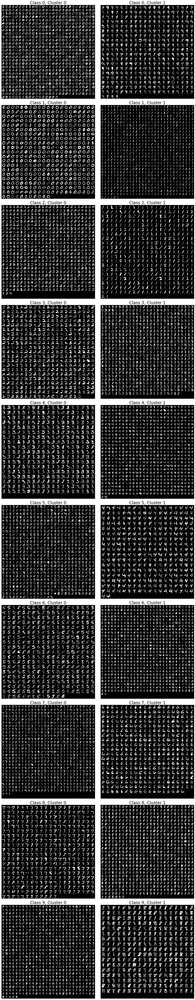

In [ ]:
# Getting the visualizations for our clusters
sprites_by_class = ClusteringDetector.visualize_clusters(
    x_raw=x_train, 
    save=False
    )

# Creating a plot figure and axes for the clusters
fig, axes = create_figure_axes(
    nrows=10, 
    ncols=2, 
    figsize=(20, 100)
    )

# Maximizing the use of space in the figure
plt.tight_layout()

# Visualizing the clusters for each class
for i in range(10):    
    for j in range(2):        
        axes[i, j].imshow(sprites_by_class[i][j])   
        axes[i, j].set_xticks(ticks=[])
        axes[i, j].set_yticks(ticks=[])
        axes[i, j].set_title(label=f"Class {i}, Cluster {j}", fontdict={'fontsize':30}) 

As you can see in the clusters above, it is possible to visually identify which class has been poisoned in fact in the relative clusters are present the samples of the source class with triggers.

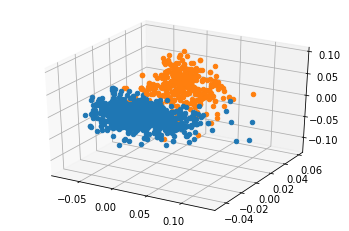

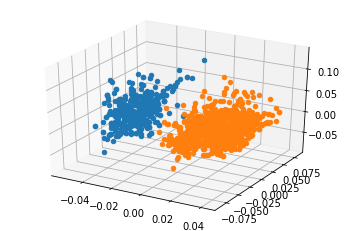

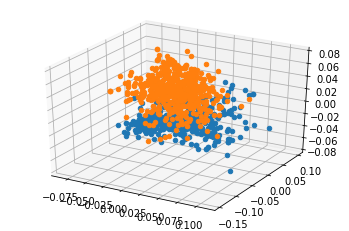

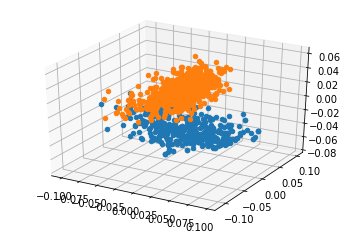

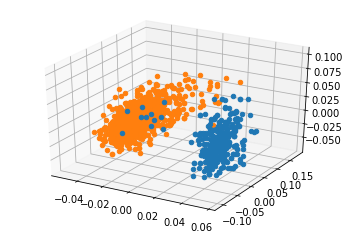

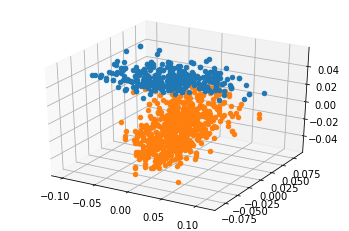

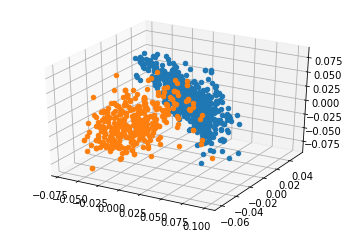

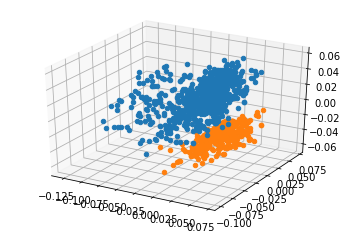

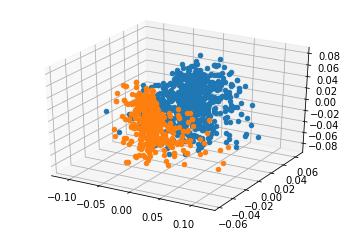

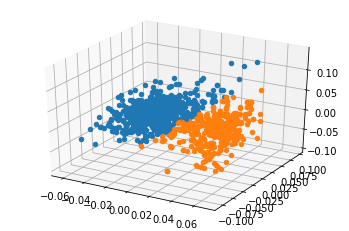

In [ ]:
plot_clusters = ClusteringDetector.plot_clusters()

As you can see, the clusters of the poisoned classes (in this case all) are separate. This is another visual way to see if the dataset is poisoned.
OSS.
In some cases the separation is not clearly seen in the graph for reasons of perspective.

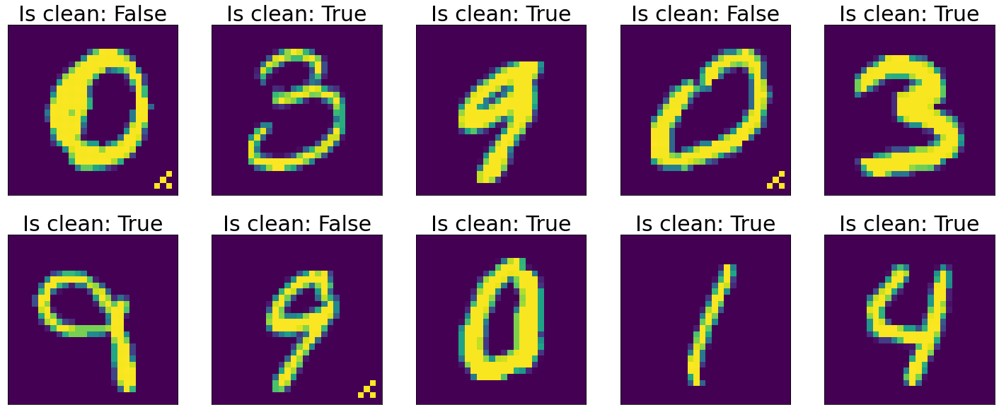

In [ ]:
# Plotting ten samples of training images and their labels to see if the algorithm correctly classifies them as poisoned or clean
plot_images(
    images=np.squeeze(x_train), 
    labels=np.array(object=is_clean) == 1,
    plot_label="Is clean",
    is_categorical=False,
    nrows=2,
    ncols=5,
    figsize=(25, 10))

As you can see above the algorithm seems to work well. In the ten samples shown all are classified correctly. Then the poisoned samples in the dataset can be found using this algorithm.

In [ ]:
# Evaluate method when ground truth is known:
print("------------------- Results using size metric -------------------")
is_clean = (is_poison_train == 0)
confusion_matrix = ClusteringDetector.evaluate_defence(is_clean[shuffled_indices])

jsonObject = json.loads(confusion_matrix)
for label in jsonObject:
    print(label)
    pprint.pprint(jsonObject[label]) 

------------------- Results using size metric -------------------
class_0
{'FalseNegative': {'denominator': 382, 'numerator': 1, 'rate': 0.26},
 'FalsePositive': {'denominator': 775, 'numerator': 31, 'rate': 4.0},
 'TrueNegative': {'denominator': 775, 'numerator': 744, 'rate': 96.0},
 'TruePositive': {'denominator': 382, 'numerator': 381, 'rate': 99.74}}
class_1
{'FalseNegative': {'denominator': 431, 'numerator': 0, 'rate': 0.0},
 'FalsePositive': {'denominator': 876, 'numerator': 2, 'rate': 0.23},
 'TrueNegative': {'denominator': 876, 'numerator': 874, 'rate': 99.77},
 'TruePositive': {'denominator': 431, 'numerator': 431, 'rate': 100.0}}
class_2
{'FalseNegative': {'denominator': 346, 'numerator': 0, 'rate': 0.0},
 'FalsePositive': {'denominator': 703, 'numerator': 161, 'rate': 22.9},
 'TrueNegative': {'denominator': 703, 'numerator': 542, 'rate': 77.1},
 'TruePositive': {'denominator': 346, 'numerator': 346, 'rate': 100.0}}
class_3
{'FalseNegative': {'denominator': 375, 'numerator': 

/usr/local/lib/python3.7/dist-packages/art/defences/detector/poison/clustering_analyzer.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.asarray(all_assigned_clean), summary_poison_clusters, report


As can be seen from the overall evaluation, the algorithm works very well finding almost all poisoned samples (True Positive Rate). The only mistakes made are due to the fact that some clean examples are classified as poisoned but this does not worry because they are few and the false positives are less relevant than the false negatives (which, on the other hand, are very few) for the security of the system.